In [0]:
import sys
import pandas as pd
import gdown
import os
from gensim.models import Word2Vec 
import matplotlib.pyplot as plt
%matplotlib inline

import warnings;
warnings.filterwarnings('ignore')

In [0]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

In [0]:
df=pd.read_csv('/content/drive/Shared drives/Project_256/Complete_Data_new.gz',compression='gzip')

In [0]:
df.head()

,Unnamed: 0,text_reviews_count,country_code,language_code,popular_shelves,is_ebook,average_rating,description,authors,publication_year,book_id,ratings_count,title,title_without_series,user_id,review_id,is_read,rating,date_added,date_updated,read_at,started_at,review_text,n_votes,n_comments,authorid
0,0,1,US,NaN,"[{'count': '228', 'name': 'to-read'}, {'count'...",True,4.12,Lillian Ann Cross is forced to live the worst ...,"[{'author_id': '8551671', 'role': ''}]",NaN,25742454,1,The Switchblade Mamma,The Switchblade Mamma,f1830550c10246b9924d03fbb7858a3b,cadab2ad2d162553b3b6b2a5884ec0ea,True,5,Wed Jun 15 16:38:58 -0700 2016,Wed Jun 15 16:38:59 -0700 2016,Wed Jun 15 16:38:59 -0700 2016,NaN,Raw and amazing \n This book is unlike any oth...,0.0,0.0,['8551671']
1,1,2,US,fre,"[{'count': '2', 'name': 'bd'}, {'count': '2', ...",False,3.94,"Florence Dupre Latour raconte comment, de son ...","[{'author_id': '3274315', 'role': ''}]",2016.0,30128855,16,Cruelle,Cruelle,12c0f4c16b6cad9f595fc99f3dcb49d4,60158dd333055f54053506e590cc1291,True,4,Mon May 09 05:03:09 -0700 2016,Tue May 10 07:07:51 -0700 2016,Mon May 09 00:00:00 -0700 2016,NaN,NaN,NaN,NaN,['3274315']
2,2,2,US,fre,"[{'count': '2', 'name': 'bd'}, {'count': '2', ...",False,3.94,"Florence Dupre Latour raconte comment, de son ...","[{'author_id': '3274315', 'role': ''}]",2016.0,30128855,16,Cruelle,Cruelle,bdd5da2d7c778880e20573efd4df888a,a4b605858b28feff2cb14018839950d1,True,5,Sat Jan 21 07:18:46 -0800 2017,Sun Feb 05 06:35:09 -0800 2017,Sun Feb 05 06:35:09 -0800 2017,Sat Jan 21 00:00:00 -0800 2017,NaN,NaN,NaN,['3274315']
3,3,2,US,fre,"[{'count': '2', 'name': 'bd'}, {'count': '2', ...",False,3.94,"Florence Dupre Latour raconte comment, de son ...","[{'author_id': '3274315', 'role': ''}]",2016.0,30128855,16,Cruelle,Cruelle,15b0c6dbe18c5e493b39aaa30cb6d2b8,111f1d4941d77877558c4a4ffff87239,False,0,Mon Apr 24 08:28:14 -0700 2017,Mon Apr 24 08:28:20 -0700 2017,NaN,NaN,NaN,NaN,NaN,['3274315']
4,4,2,US,fre,"[{'count': '2', 'name': 'bd'}, {'count': '2', ...",False,3.94,"Florence Dupre Latour raconte comment, de son ...","[{'author_id': '3274315', 'role': ''}]",2016.0,30128855,16,Cruelle,Cruelle,dc9f898ef44e9d38d8eb92a7bde1341d,831e2005e78a56b1f90b26877eeea1f3,True,2,Sun Aug 28 16:15:38 -0700 2016,Thu Sep 08 16:51:22 -0700 2016,Thu Sep 08 16:51:22 -0700 2016,NaN,NaN,NaN,NaN,['3274315']


In [0]:
len(df)

7347630

In [0]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7347630 entries, 0 to 7347629
Data columns (total 26 columns):
Unnamed: 0              int64
text_reviews_count      int64
country_code            object
language_code           object
popular_shelves         object
is_ebook                bool
average_rating          float64
description             object
authors                 object
publication_year        float64
book_id                 int64
ratings_count           int64
title                   object
title_without_series    object
user_id                 object
review_id               object
is_read                 bool
rating                  int64
date_added              object
date_updated            object
read_at                 object
started_at              object
review_text             object
n_votes                 float64
n_comments              float64
authorid                object
dtypes: bool(2), float64(4), int64(5), object(15)
memory usage: 1.3+ GB


In [0]:
df.isnull().sum()

Unnamed: 0                    0
text_reviews_count            0
country_code                  0
language_code           1149907
popular_shelves               0
is_ebook                      0
average_rating                0
description              529032
authors                       0
publication_year         829880
book_id                       0
ratings_count                 0
title                         0
title_without_series          0
user_id                       0
review_id                     0
is_read                       0
rating                        0
date_added                    0
date_updated                  0
read_at                 5086379
started_at              5856311
review_text             6805615
n_votes                 6805292
n_comments              6805292
authorid                      0
dtype: int64

In [0]:
shelve_user = df['user_id'].value_counts().value_counts().reset_index().sort_values('index').values
read_user = df['user_id'].loc[df['is_read']>0].value_counts().value_counts().reset_index().sort_values('index').values
rate_user = df['user_id'].loc[df['rating']>0].value_counts().value_counts().reset_index().sort_values('index').values
#review_user = df['user_id'].loc[df['is_reviewed']>0].value_counts().value_counts().reset_index().sort_values('index').values

shelve_book = df['book_id'].value_counts().value_counts().reset_index().sort_values('index').values
read_book = df['book_id'].loc[df['is_read']>0].value_counts().value_counts().reset_index().sort_values('index').values
rate_book = df['book_id'].loc[df['rating']>0].value_counts().value_counts().reset_index().sort_values('index').values
#review_book = df['book_id'].loc[df['is_reviewed']>0].value_counts().value_counts().reset_index().sort_values('index').values

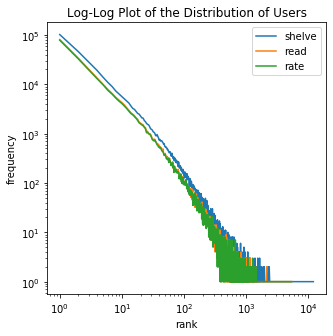

In [0]:
plt.figure(figsize=(5,5))
plt.loglog(shelve_user[:,0], shelve_user[:,1], label='shelve')
plt.loglog(read_user[:,0], read_user[:,1], label='read')
plt.loglog(rate_user[:,0], rate_user[:,1], label='rate')
#plt.loglog(review_user[:,0], review_user[:,1], label='review')
plt.xlabel('rank')
plt.ylabel('frequency')
plt.title('Log-Log Plot of the Distribution of Users')
plt.legend(loc='upper right')

In [0]:
data = df[['user_id', 'book_id', 'date_added', 'title']]
data['book_id']= data['book_id'].astype(str)

In [0]:
data.head()

,user_id,book_id,date_added,title
0,f1830550c10246b9924d03fbb7858a3b,25742454,Wed Jun 15 16:38:58 -0700 2016,The Switchblade Mamma
1,12c0f4c16b6cad9f595fc99f3dcb49d4,30128855,Mon May 09 05:03:09 -0700 2016,Cruelle
2,bdd5da2d7c778880e20573efd4df888a,30128855,Sat Jan 21 07:18:46 -0800 2017,Cruelle
3,15b0c6dbe18c5e493b39aaa30cb6d2b8,30128855,Mon Apr 24 08:28:14 -0700 2017,Cruelle
4,dc9f898ef44e9d38d8eb92a7bde1341d,30128855,Sun Aug 28 16:15:38 -0700 2016,Cruelle


In [0]:
import dateutil
data['date_added'] = data['date_added'].apply(dateutil.parser.parse, ignoretz=True)

In [0]:
data.head()

,user_id,book_id,date_added,title
0,f1830550c10246b9924d03fbb7858a3b,25742454,2016-06-15 16:38:58,The Switchblade Mamma
1,12c0f4c16b6cad9f595fc99f3dcb49d4,30128855,2016-05-09 05:03:09,Cruelle
2,bdd5da2d7c778880e20573efd4df888a,30128855,2017-01-21 07:18:46,Cruelle
3,15b0c6dbe18c5e493b39aaa30cb6d2b8,30128855,2017-04-24 08:28:14,Cruelle
4,dc9f898ef44e9d38d8eb92a7bde1341d,30128855,2016-08-28 16:15:38,Cruelle


In [0]:

users = data["user_id"].unique().tolist()
len(users)

342415

In [0]:
print(users)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [0]:
import random
random.shuffle(users)

# extract 90% of customer ID's
user_train = [users[i] for i in range(round(0.9*len(users)))]
len(user_train)


308174

In [0]:
print(user_train)
print(data['user_id'].isin(user_train))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0          True
1          True
2          True
3          True
4          True
           ... 
7347625    True
7347626    True
7347627    True
7347628    True
7347629    True
Name: user_id, Length: 7347630, dtype: bool


In [0]:
# split data into train and validation set
train_df = data[data['user_id'].isin(user_train)]
print(train_df)


                                  user_id  ...                  title
0        f1830550c10246b9924d03fbb7858a3b  ...  The Switchblade Mamma
1        12c0f4c16b6cad9f595fc99f3dcb49d4  ...                Cruelle
2        bdd5da2d7c778880e20573efd4df888a  ...                Cruelle
3        15b0c6dbe18c5e493b39aaa30cb6d2b8  ...                Cruelle
4        dc9f898ef44e9d38d8eb92a7bde1341d  ...                Cruelle
...                                   ...  ...                    ...
7347625  40cad038063319b661615c26cb2b3c18  ...           Dead Endings
7347626  8bcf48afa72aba125b53749c2e7c9ad4  ...           Dead Endings
7347627  699b0a72e1e07abc5a6d2736b109928f  ...           Dead Endings
7347628  262b53abd0d2da2e8d02c362fdeaf4f5  ...           Dead Endings
7347629  5fa1e552e5aeb58c6d97614c51bfb1d4  ...           Dead Endings

[6624296 rows x 4 columns]


In [0]:
validation_df = data[~data['user_id'].isin(user_train)]
print(validation_df)

                                  user_id  ...                                 title
27       01d504e19fe9664bb6e3f1642ec0f735  ...             Superman Archives, Vol. 2
28       06bc6274f4b6c9db5704002c5af98563  ...             Superman Archives, Vol. 2
29       c02f1cf5d679b0fe03c812ca64286320  ...             Superman Archives, Vol. 2
42       b2a85460096bdaaa2748ef7eccc1801c  ...               A.I. Revolution, Vol. 1
66       3b64013680060be51fdf495063829ca3  ...                 War Stories, Volume 3
...                                   ...  ...                                   ...
7347565  96686efad3401971c4f398d9bb3fc9c6  ...  Doctor Who: Free Comic Book Day 2016
7347577  d10b95767c9d795dbd5e4d0135395a89  ...  Doctor Who: Free Comic Book Day 2016
7347578  f1ed04de8c27ad4538443264ea415b2c  ...  Doctor Who: Free Comic Book Day 2016
7347592  9d7bf5ab5459bff45eda9c85ff028cf4  ...  Doctor Who: Free Comic Book Day 2016
7347605  eeb8f2342614357e60d24888542e1bcb  ...     La búsqueda de

In [0]:
train_df.groupby(['user_id']).groups.keys()

dict_keys(['00004584d524ec468619e81b176cc991', '00009e46d18f223a82b22da38586b605', '0000bad9195b66484e98f7f4be5f227a', '0001085188e302fc6b2568de45a5f56b', '00013344a98d0147eacab88d3e1502ef', '0001592d9ddd2588d815969f86132b49', '000192962b87d560f00b06fdcbd71681', '000243c8e211fb3f359e4ff45ca899ea', '000253cf1077f203bca050637f2ec7f7', '000258cdb856ee85203323147d1223dd', '000259bcbae87b5fd301a6f507ac3f49', '00034e7004b7de8f5da32c23b1330859', '000387b0e3d77b6dcc36a66d5cc27347', '0003a8eb2989503d03ad7ca701898a48', '0003ee244baffc606180635da8c51829', '0003f216823de684cea464170efe1d42', '000405c1347eaa4f4ad1d524e0321ea7', '00041cc1662811b6f104196270881f13', '0004a0bcdd96ce79bfccae1ff9459383', '00052f373c101767aca448f09a9b07e5', '000567e1d7b1e5da1f1a6a717ca3c680', '0005999c31342c423bc99c637f7bb367', '0005a08accd53b1e19c52109a1f478cb', '0005f52944ea1992e95d61f287acaea9', '0006260f85929db85eddee3a0bd0e504', '00063fbdeb226ca2ea6c0cb9c14ff618', '00064647e5c2eef407430b43f75a7656', '0006de2967df1ec4

In [0]:
train_df[train_df.user_id == 'bd53fcba9dbb9ca1d2ca1551b44007e7'	]

,user_id,book_id,date_added,title


In [0]:
train_df.groupby('user_id')['book_id'].count()

user_id
00004584d524ec468619e81b176cc991     24
00009e46d18f223a82b22da38586b605      3
0000bad9195b66484e98f7f4be5f227a     14
0001085188e302fc6b2568de45a5f56b      2
00013344a98d0147eacab88d3e1502ef      1
                                   ... 
ffff7cafdaf5196383cb2efca08fb6fe     21
ffff7cf38c717c8172ff5ba656cec6df      2
ffffbb062a8b208c9c1031b529c08f7a    144
ffffd81a724c0fa70ac37cd347c1c0f1      1
fffff8a718843c0e11dfd93fb41c1297     10
Name: book_id, Length: 308174, dtype: int64

In [0]:
grouped = train_df.groupby(['user_id'],as_index=False).apply(lambda x: x.sort_values(["date_added"], ascending = True))


In [0]:
type(grouped)

pandas.core.frame.DataFrame

In [0]:
grouped.head(100)

user_id  ...                                              title
0  2374691  00004584d524ec468619e81b176cc991  ...                              Fruits Basket, Vol. 1
   5526315  00004584d524ec468619e81b176cc991  ...       Kare Kano: His and Her Circumstances, Vol. 1
   3147545  00004584d524ec468619e81b176cc991  ...       Kare Kano: His and Her Circumstances, Vol. 2
   6245556  00004584d524ec468619e81b176cc991  ...      Kare Kano: His and Her Circumstances, Vol. 12
   3147164  00004584d524ec468619e81b176cc991  ...       Kare Kano: His and Her Circumstances, Vol. 3
...                                      ...  ...                                                ...
12 5173904  000387b0e3d77b6dcc36a66d5cc27347  ...   Uglies: Shay's Story (Uglies: Graphic Novel, #1)
13 5917842  0003a8eb2989503d03ad7ca701898a48  ...  Naruto, Vol. 01: The Tests of the Ninja (Narut...
   4130763  0003a8eb2989503d03ad7ca701898a48  ...       Death Note, Vol. 1: Boredom (Death Note, #1)
   4829754  0003a8eb2989503d03ad7ca701898a48  ...                          Bakuman: Complete Box Set
   430293   0003a8eb2989503d03ad7ca701898a48  ...                               Si Juki: Komik Strip

[100 rows x 4 columns]

In [0]:
reading_history = grouped.groupby('user_id')['book_id'].apply(list).reset_index()



In [0]:
type(reading_history)

pandas.core.frame.DataFrame

In [0]:
reading_list = reading_history['book_id'].tolist()
print(reading_list[2])

['472331', '25103', '21330', '5805', '25100', '15719', '1270615', '7746259', '342445', '43808', '30288', '1799011', '6052502', '7278189']


In [0]:

# train word2vec model
model = Word2Vec(window = 5, sg = 1,
                 # for negative sampling
                 min_count=1, size=150, iter=10)

model.build_vocab(reading_list, progress_per=200)

model.train(reading_list, total_examples = model.corpus_count, 
            epochs=10, report_delay=1)

(65805752, 66242960)

In [0]:
# save word2vec model
model.save("word2vec_2.model")

In [0]:
model.init_sims(replace=True)

In [0]:
print(model)

Word2Vec(vocab=88854, size=150, alpha=0.025)


In [0]:
# extract all vectors
X = model[model.wv.vocab]

X.shape

(88854, 150)

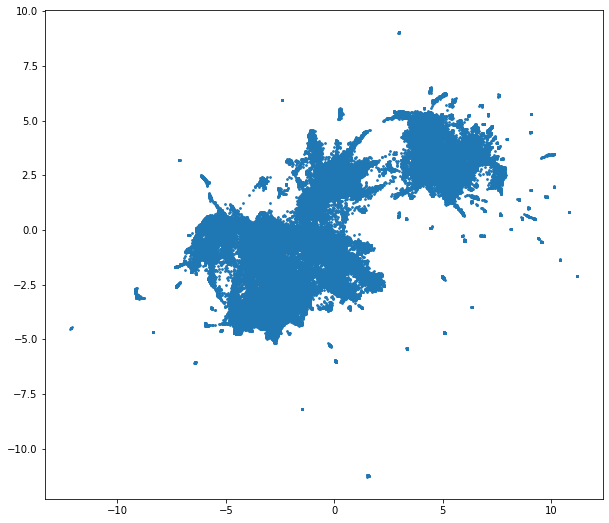

In [0]:
import umap

cluster_embedding = umap.UMAP(n_neighbors=30, min_dist=0.0,
                              n_components=2, random_state=42).fit_transform(X)

plt.figure(figsize=(10,9))
plt.scatter(cluster_embedding[:, 0], cluster_embedding[:, 1], s=3, cmap='Spectral')

In [0]:
books = df[['book_id', 'title']]
books['book_id']= books['book_id'].astype(str)
# remove duplicates
books.drop_duplicates(inplace=True, subset='book_id', keep="last")

# create product-ID and product-description dictionary
books_dict = books.groupby('book_id')['title'].apply(list).to_dict()

In [0]:
books_dict['22731045']

['Adventure Time: Banana Guard Academy #1']

In [0]:
print(books_dict)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [0]:
def similar_products(v, n = 20):
    
    # extract most similar products for the input vector
    ms = model.similar_by_vector(v, topn= n+1)[1:]
    
    # extract name and similarity score of the similar products
    new_ms = []
    for j in ms:
        pair = (books_dict[j[0]][0], j[1])
        new_ms.append(pair)
        
    return new_ms

In [0]:
train_df[train_df.book_id == '22731045'	]

,user_id,book_id,date_added,title
445572,efeb60924553d8479abbf867808b088a,22731045,2014-12-26 11:48:39,Adventure Time: Banana Guard Academy #1
445573,13acb38d331070b41052a24a195d5d1a,22731045,2016-10-14 09:18:07,Adventure Time: Banana Guard Academy #1
445574,39b1ec9c3bd044dde42d789194df754d,22731045,2015-12-27 09:47:48,Adventure Time: Banana Guard Academy #1
445575,32007c42b5a65cb3727b5ff47d78565b,22731045,2017-02-22 19:23:33,Adventure Time: Banana Guard Academy #1
445576,1b9322282a5a42fef97b44aea4111005,22731045,2017-01-07 07:06:37,Adventure Time: Banana Guard Academy #1
445577,230d87564c417da403c7a8f3bb4adac7,22731045,2015-05-05 13:35:58,Adventure Time: Banana Guard Academy #1
445579,f16bd0eb123509de59f661b5f658a806,22731045,2015-03-29 00:09:24,Adventure Time: Banana Guard Academy #1
445581,b396ef404057fe2fee941852854e9d38,22731045,2015-01-02 08:54:43,Adventure Time: Banana Guard Academy #1
445582,afa9a578247cfb907986c8413def4bc4,22731045,2014-07-15 19:52:18,Adventure Time: Banana Guard Academy #1
445583,d660b1c2b20c5f2f78e9f5bb51fe26b2,22731045,2016-09-04 17:37:49,Adventure Time: Banana Guard Academy #1


In [0]:
books_dict['25233412']

['Lumberjanes #6']

In [0]:
similar_products(model['25233412'])

[('Lumberjanes #7', 0.9325823187828064),
 ('Lumberjanes #5', 0.9017583131790161),
 ('Lumberjanes #8', 0.8778830170631409),
 ('Lumberjanes #4', 0.7941821217536926),
 ('Lumberjanes #9', 0.7810419201850891),
 ('Lumberjanes #10', 0.7372153997421265),
 ('Superman Vol. 5: Under Fire (The New 52)', 0.7367032170295715),
 ('Lumberjanes #11', 0.7329199314117432),
 ('Lumberjanes #3', 0.7130403518676758),
 ('Lumberjanes #2', 0.7023740410804749),
 ('X-Men Origins: Nightcrawler #1 (X-Men Origins (2008-2010))',
  0.6931242346763611),
 ("Archie: Rockin' the World", 0.690088152885437),
 ('Lumberjanes #12', 0.6887417435646057),
 ('Lumberjanes #13', 0.6880751848220825),
 ('Afterlife With Archie #7: Betty R.I.P. Chapter 2 - Dear Diary... (Afterlife With Archie Series)',
  0.6755809783935547),
 ('Eye of Newt #1', 0.6600601077079773),
 ('Aguas negras', 0.659723162651062),
 ('Steven Universe #3', 0.6519688963890076),
 ('Adventure Time Summer 2013 Special #1', 0.6469668745994568),
 ('Lumberjanes #1', 0.645776

In [0]:
#train_df[train_df.book_id == '25233412'	].count()
print(train_df[train_df.book_id == '25233412'].shape[0])

452


In [0]:
similar_products(model['22731045'])

[('Adventure Time: Candy Capers #3', 0.8168614506721497),
 ('Adventure Time: Candy Capers Mathematical Edition', 0.8117458820343018),
 ('Adventure Time: Banana Guard Academy #2', 0.8115301132202148),
 ('Adventure Time: Candy Capers #4', 0.8079405426979065),
 ('Oddly Normal #2', 0.8036068677902222),
 ('The Woods #2', 0.7872409224510193),
 ('Adventure Time: The Flip Side #1', 0.7826576828956604),
 ('Adventure Time Volume 4', 0.7799519300460815),
 ('Adventure Time: Candy Capers #2', 0.778986930847168),
 ('The Woods #3', 0.7784239649772644),
 ('Five Weapons #3', 0.7768614888191223),
 ('Adventure Time: Candy Capers #5', 0.7761087417602539),
 ('Oddly Normal #6', 0.7760911583900452),
 ('Penny Dora and the Wishing Box #3', 0.7733700275421143),
 ('Regular Show: Skips (Full series)', 0.7731320261955261),
 ('Adventure Time Summer 2013 Special #1', 0.7730478644371033),
 ('Oddly Normal #7', 0.7728835344314575),
 ('Adventure Time: Banana Guard Academy #3', 0.7728036642074585),
 ('Adventure Time: Can

In [0]:
# Need to check all below logic

In [0]:
validation_df.groupby(['user_id']).groups.keys()

dict_keys(['000512abfe3c7d7e8fcc69d84909fbb2', '0005d7a245195fa0f6c49876c8782cba', '0006a5b8cda1ba6d7b911dc575f6547b', '0008931c0cde961e9c802c5a58196d23', '000bda4c40719612799273159eb2aa39', '000d05b465526449c01690c1ed30b677', '000d9bd331ef984576f5151a7101c470', '0011b8f0b259a5351cc28bfb1e6e6934', '001201e3ed8205a3a7b6ca4eb0af5c51', '0012c85a198f6fa66d02218b885d451e', '00153d136ac254437511fad5e10e246d', '001570676f7943d9c445d2209ccbabfb', '00159b12f56f8f8343e8627ce02b7a5a', '0016504d0190bfd66d0ff323f0d56265', '0017507d4413a03fbfa5848972658206', '0017bc9bc41e227288b32d024eab84e9', '0018fd95d5b166fc65be4766d024fc0b', '001d9a120db8792b54924fac57faef7b', '001eb567b3331c3ef3291a801d31be4a', '002173016543fcc616f40b53b3fa17fa', '0021821cfbad596d8ad80d319733a60b', '002360c6a6866deef39b1922138b204d', '00250869a5e9e9c120ef65e96a4aa18f', '0027b32d6913c4b85230a9c8c6ea21c3', '0029b250cad1be96d172447b0386ad6d', '002b2ae628bd8ffaf71ee8f47a0c8fc6', '002f67a40c4fa67c1bb4ae95e2cf3e31', '002f9e1994483b6b

In [0]:
grouped_validation = validation_df.groupby(['user_id'],as_index=False).apply(lambda x: x.sort_values(["date_added"], ascending = True))


In [0]:
print(grouped_validation['book_id'])

0      6083189       87917
       2344091     8744427
       474716       424597
1      5378150    20701984
2      4125960       13615
                    ...   
34240  2142148    13223349
       6347134     1823114
       695545        15195
       2009846    25819504
       3125104     7631912
Name: book_id, Length: 723334, dtype: object


In [0]:
def aggregate_vectors(products):
    product_vec = []
    for i in products:
        try:
            product_vec.append(model[i])
        except KeyError:
            continue
        
    return np.mean(product_vec, axis=0)

In [0]:
len(purchases_val[0])

In [0]:
aggregate_vectors(purchases_val[0]).shape

In [0]:

similar_products(aggregate_vectors(purchases_val[0]))